#Name: Urmi Karmakar

#Project Name: Restaurant Customer Preference and Rating Analysis.

##Import Necessary Libraries

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


## Load the dataset

In [63]:
df = pd.read_csv('/content/Dataset .csv')

##Level 1 Task 1
###Task: Data Exploration and Preprocessing

## Display basic information

In [8]:
print("Dataset Information:\n")
df.info()

Dataset Information:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15 

# Check the number of rows and columns

In [9]:
print("\nNumber of rows and columns:", df.shape)

# Display the first few rows
print("\nSample Data:")
df.head()


Number of rows and columns: (9551, 21)

Sample Data:


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


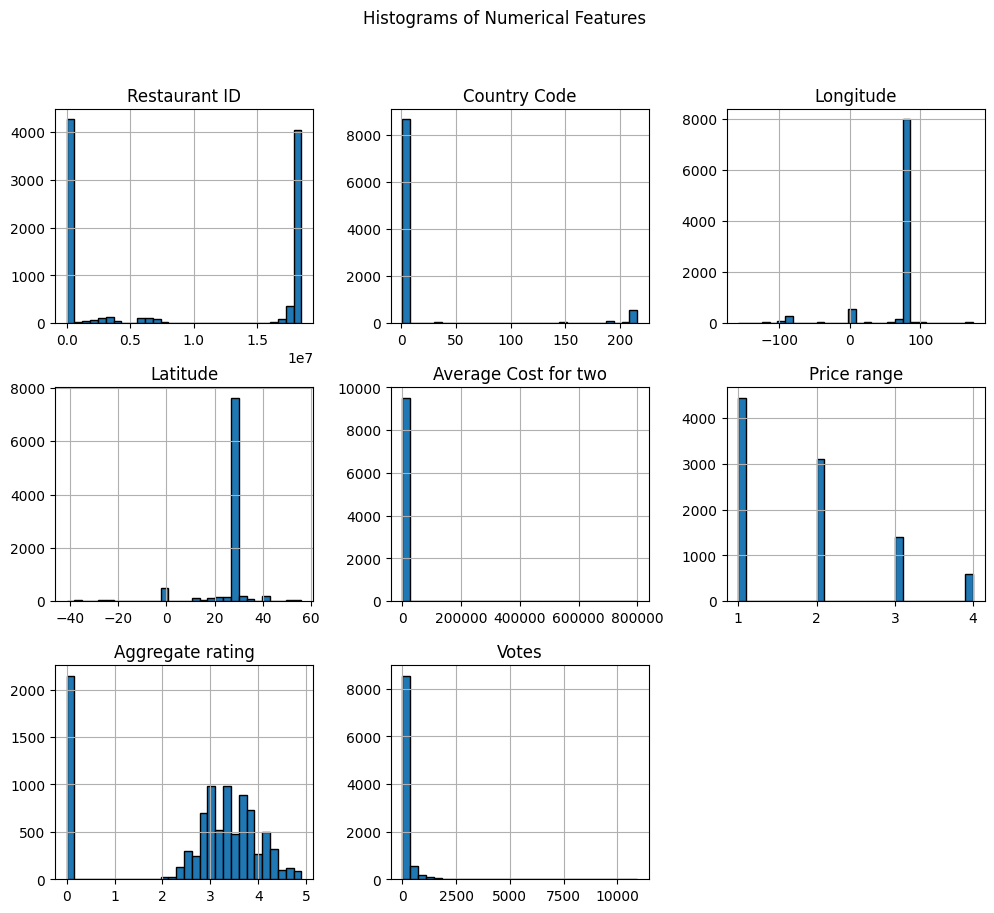

In [10]:
df.hist(figsize=(12, 10), bins=30, edgecolor='black')
plt.suptitle('Histograms of Numerical Features')
plt.show()

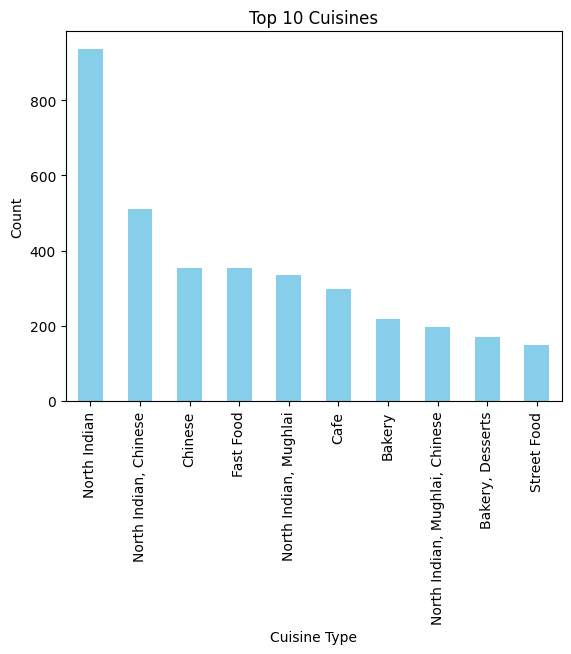

In [11]:
df['Cuisines'].value_counts().head(10).plot(kind='bar', color='skyblue')
plt.title('Top 10 Cuisines')
plt.xlabel('Cuisine Type')
plt.ylabel('Count')
plt.show()

# Check for missing values in each column

In [12]:
df.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,9


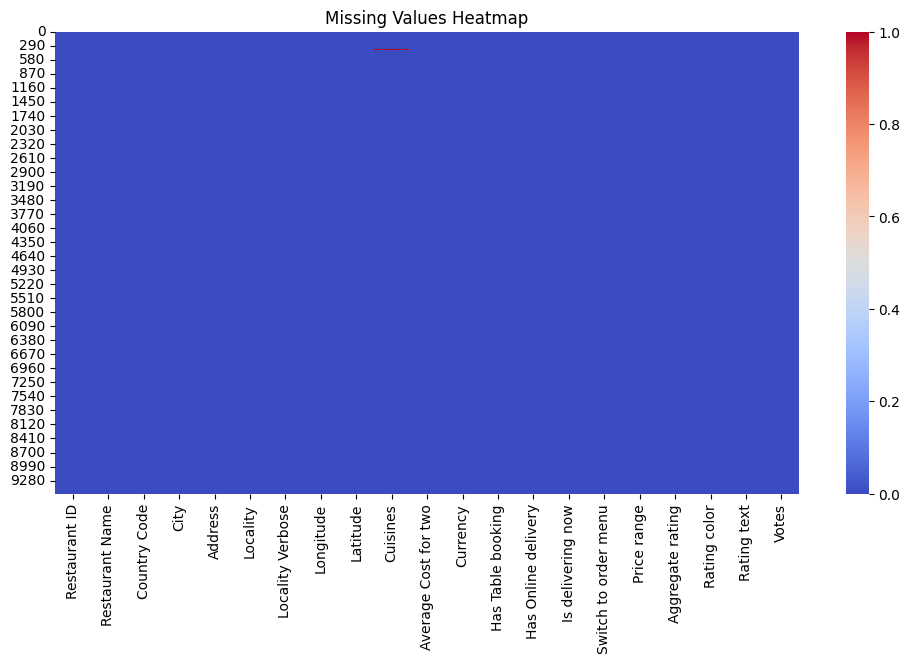

In [64]:
plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cmap='coolwarm')
plt.title('Missing Values Heatmap')
plt.show()

# Fill missing values in categorical columns with the most frequent value

In [14]:
most_frequent_cuisine = df['Cuisines'].mode()[0]
df['Cuisines'] = df['Cuisines'].fillna(most_frequent_cuisine)
print(f"Missing values in 'Cuisines' filled with: {most_frequent_cuisine}")

# Verify missing values after handling
print("\nMissing Values After Handling:\n", df.isnull().sum())


Missing values in 'Cuisines' filled with: North Indian

Missing Values After Handling:
 Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


# Analyze the distribution of the target variable

In [16]:

print("\nDistribution of Aggregate Rating:\n")
print(df['Aggregate rating'].value_counts().sort_index())



Distribution of Aggregate Rating:

Aggregate rating
0.0    2148
1.8       1
1.9       2
2.0       7
2.1      15
2.2      27
2.3      47
2.4      87
2.5     110
2.6     191
2.7     250
2.8     315
2.9     381
3.0     468
3.1     519
3.2     522
3.3     483
3.4     498
3.5     480
3.6     458
3.7     427
3.8     400
3.9     335
4.0     266
4.1     274
4.2     221
4.3     174
4.4     144
4.5      95
4.6      78
4.7      42
4.8      25
4.9      61
Name: count, dtype: int64


# Check for class imbalance

In [17]:
class_distribution = df['Aggregate rating'].value_counts(normalize=True) * 100
print("\nClass Imbalance Percentage:\n", class_distribution)


Class Imbalance Percentage:
 Aggregate rating
0.0    22.489792
3.2     5.465396
3.1     5.433986
3.4     5.214114
3.3     5.057062
3.5     5.025652
3.0     4.900010
3.6     4.795309
3.7     4.470736
3.8     4.188043
2.9     3.989111
3.9     3.507486
2.8     3.298084
4.1     2.868810
4.0     2.785049
2.7     2.617527
4.2     2.313894
2.6     1.999791
4.3     1.821799
4.4     1.507696
2.5     1.151712
4.5     0.994660
2.4     0.910899
4.6     0.816668
4.9     0.638677
2.3     0.492095
4.7     0.439745
2.2     0.282693
4.8     0.261753
2.1     0.157052
2.0     0.073291
1.9     0.020940
1.8     0.010470
Name: proportion, dtype: float64


# Visualize the distribution of the target variable

<ipython-input-61-afb7389493d8>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Aggregate rating', data=df, palette='coolwarm', order=df['Aggregate rating'].value_counts().index)


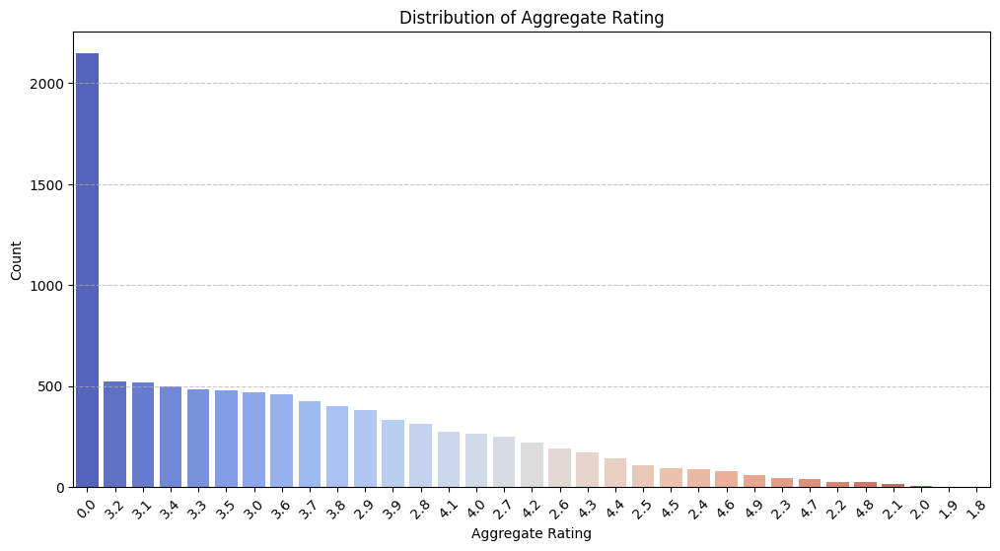

In [61]:
plt.figure(figsize=(12, 6))
sns.countplot(x='Aggregate rating', data=df, palette='coolwarm', order=df['Aggregate rating'].value_counts().index)
plt.title('Distribution of Aggregate Rating')
plt.xlabel('Aggregate Rating')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


##Level 1 Task 2
###Task: Descriptive Analysis

In [19]:
# Get the basic statistical summary for numerical columns only
summary_stats = df.describe()

# Calculate the median for numerical columns only
median_values = df.select_dtypes(include=np.number).median()

# Add the median to the summary statistics
summary_stats.loc['median'] = median_values

# Display the updated summary statistics
print(summary_stats)

        Restaurant ID  Country Code    Longitude     Latitude  \
count    9.551000e+03   9551.000000  9551.000000  9551.000000   
mean     9.051128e+06     18.365616    64.126574    25.854381   
std      8.791521e+06     56.750546    41.467058    11.007935   
min      5.300000e+01      1.000000  -157.948486   -41.330428   
25%      3.019625e+05      1.000000    77.081343    28.478713   
50%      6.004089e+06      1.000000    77.191964    28.570469   
75%      1.835229e+07      1.000000    77.282006    28.642758   
max      1.850065e+07    216.000000   174.832089    55.976980   
median   6.004089e+06      1.000000    77.191964    28.570469   

        Average Cost for two  Price range  Aggregate rating         Votes  
count            9551.000000  9551.000000       9551.000000   9551.000000  
mean             1199.210763     1.804837          2.666370    156.909748  
std             16121.183073     0.905609          1.516378    430.169145  
min                 0.000000     1.000000    

##Explore the Distribution of Categorical Variables

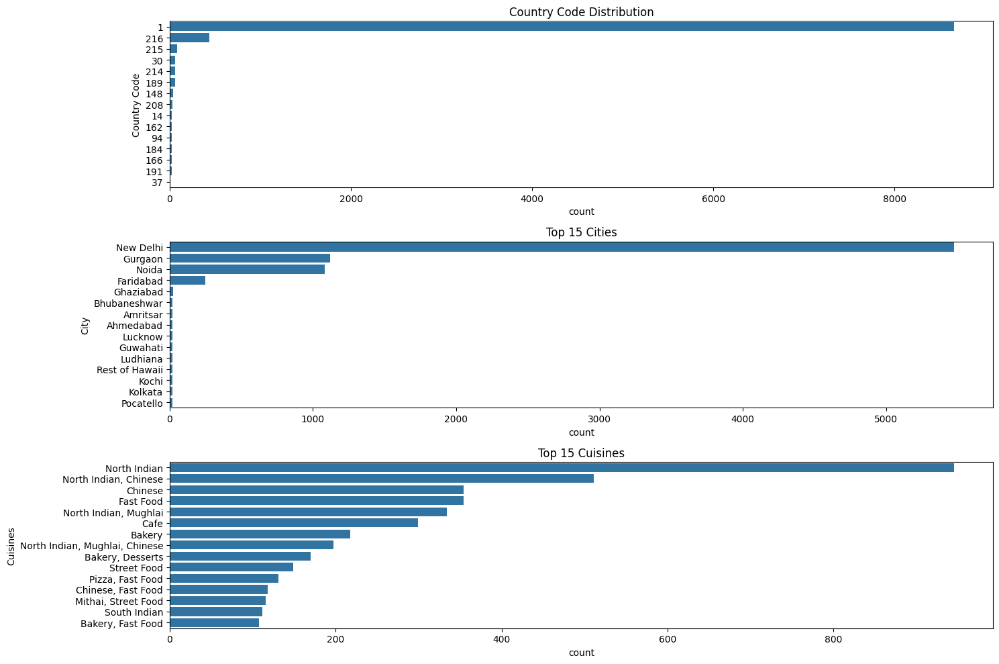

In [20]:
plt.figure(figsize=(15, 10))

# 1. Distribution of "Country Code"
plt.subplot(3, 1, 1)
sns.countplot(y='Country Code', data=df, order=df['Country Code'].value_counts().index)
plt.title('Country Code Distribution')

# 2. Distribution of "City"
plt.subplot(3, 1, 2)
sns.countplot(y='City', data=df, order=df['City'].value_counts().index[:15])
plt.title('Top 15 Cities')

# 3. Distribution of "Cuisines"
plt.subplot(3, 1, 3)
sns.countplot(y='Cuisines', data=df, order=df['Cuisines'].value_counts().index[:15])
plt.title('Top 15 Cuisines')

plt.tight_layout()
plt.show()


# Top 10 Cuisines and Cities with the highest number of restaurants

In [21]:
# Top 10 Cuisines with the highest number of restaurants
top_cuisines = df['Cuisines'].value_counts().head(10)
print("Top 10 Cuisines:")
print(top_cuisines)

# Top 10 Cities with the highest number of restaurants
top_cities = df['City'].value_counts().head(10)
print("\nTop 10 Cities:")
print(top_cities)


Top 10 Cuisines:
Cuisines
North Indian                      945
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64

Top 10 Cities:
City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64


##Level 1 Task 3
###Task: Geospatial Analysis

#Visualize restaurant locations on a map

In [22]:
import folium
from folium.plugins import MarkerCluster
from scipy.stats import pearsonr
from IPython.display import HTML, display

#Visualize restaurant locations on a map
def visualize_restaurant_locations(df):
    map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
    restaurant_map = folium.Map(location=map_center, zoom_start=5)
    marker_cluster = MarkerCluster().add_to(restaurant_map)

    for _, row in df.iterrows():
        folium.Marker(
            location=[row['Latitude'], row['Longitude']],
            popup=f"{row['Restaurant Name']} - Rating: {row['Aggregate rating']}"
        ).add_to(marker_cluster)

    # Save map
    restaurant_map.save("restaurant_map.html")

    # Display map in Colab using HTML and IPython.display.display
    # This is the preferred way for folium
    return HTML(restaurant_map._repr_html_()) # convert to html and return

# call the function and display the output
map_output = visualize_restaurant_locations(df)
display(map_output)

# Analyze restaurant distribution across cities/countries

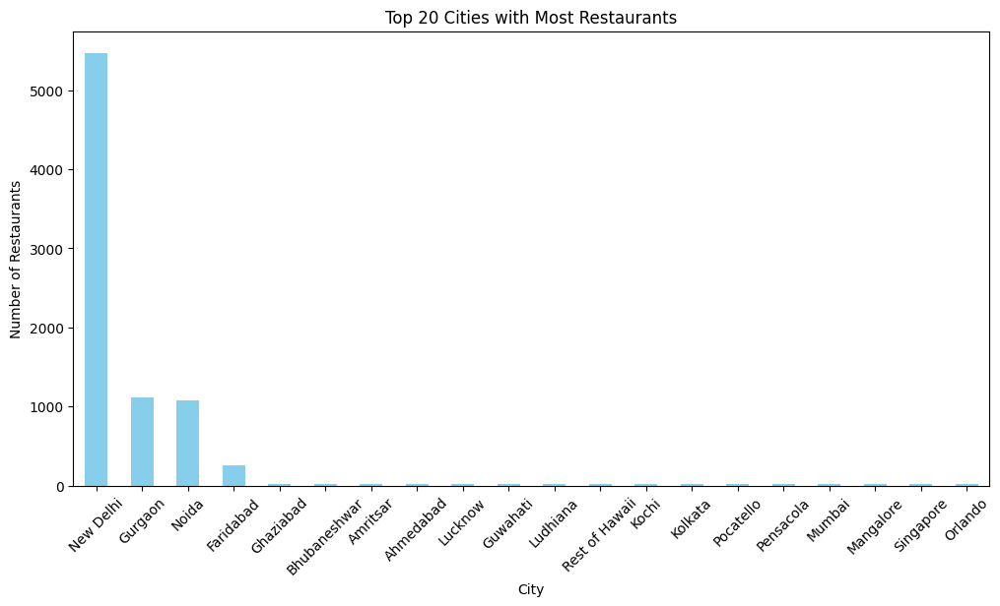

In [23]:
# Plot the distribution of restaurants per city
plt.figure(figsize=(12,6))
df['City'].value_counts().head(20).plot(kind='bar', color='skyblue')
plt.title("Top 20 Cities with Most Restaurants")
plt.xlabel("City")
plt.ylabel("Number of Restaurants")
plt.xticks(rotation=45)
plt.show()


# Check correlation between location and rating

Correlation between Latitude and Rating: 0.0005
Correlation between Longitude and Rating: -0.1168


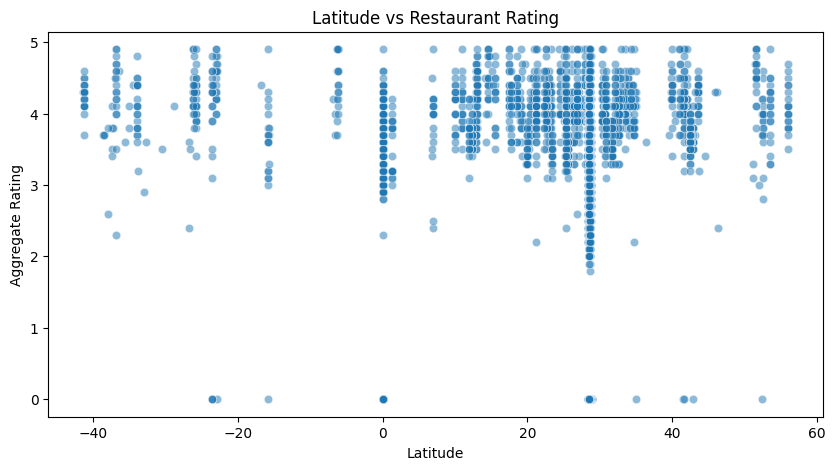

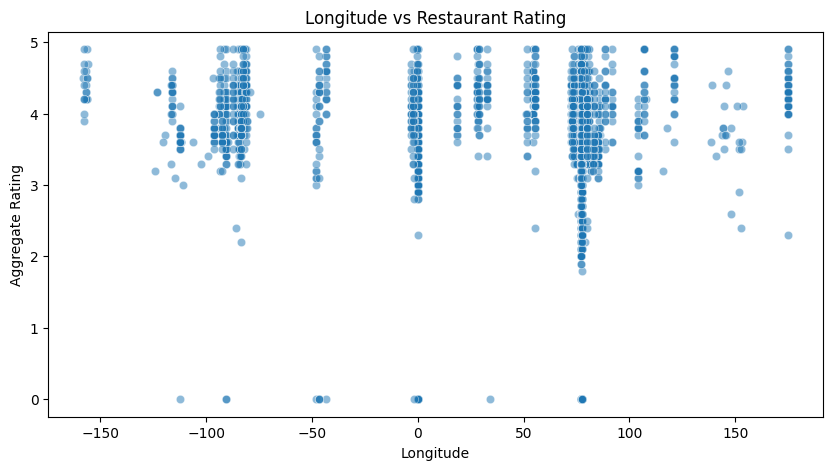

In [24]:
# Compute correlation between latitude/longitude and rating
corr_lat, _ = pearsonr(df['Latitude'], df['Aggregate rating'])
corr_lon, _ = pearsonr(df['Longitude'], df['Aggregate rating'])
print(f"Correlation between Latitude and Rating: {corr_lat:.4f}")
print(f"Correlation between Longitude and Rating: {corr_lon:.4f}")

# Scatter plot of Latitude vs Rating
plt.figure(figsize=(10,5))
sns.scatterplot(x=df['Latitude'], y=df['Aggregate rating'], alpha=0.5)
plt.title("Latitude vs Restaurant Rating")
plt.xlabel("Latitude")
plt.ylabel("Aggregate Rating")
plt.show()

# Scatter plot of Longitude vs Rating
plt.figure(figsize=(10,5))
sns.scatterplot(x=df['Longitude'], y=df['Aggregate rating'], alpha=0.5)
plt.title("Longitude vs Restaurant Rating")
plt.xlabel("Longitude")
plt.ylabel("Aggregate Rating")
plt.show()

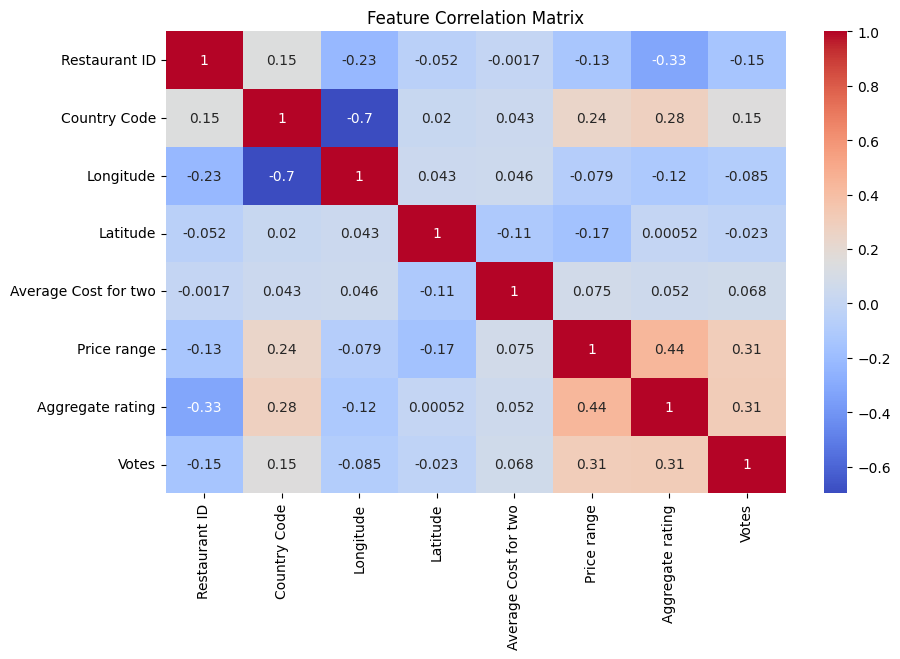

In [25]:
# Check for correlation between features
plt.figure(figsize=(10, 6))

# Select only numerical features for correlation calculation
numerical_df = df.select_dtypes(include=np.number)

sns.heatmap(numerical_df.corr(), annot=True, cmap="coolwarm")
plt.title("Feature Correlation Matrix")
plt.show()

##Level 2 Task 1
###Task: Table Booking and Online Delivery

##Determine the percentage of restaurants offering table booking and online delivery

In [26]:
# Convert values to lowercase for consistency
df['Has Table booking'] = df['Has Table booking'].str.lower()
df['Has Online delivery'] = df['Has Online delivery'].str.lower()

# Calculate the percentage
table_booking_percentage = (df['Has Table booking'] == 'yes').mean() * 100
online_delivery_percentage = (df['Has Online delivery'] == 'yes').mean() * 100

# Print the results
print(f"Percentage of restaurants offering table booking: {table_booking_percentage:.2f}%")
print(f"Percentage of restaurants offering online delivery: {online_delivery_percentage:.2f}%")


Percentage of restaurants offering table booking: 12.12%
Percentage of restaurants offering online delivery: 25.66%


##Compare the average ratings of restaurants with and without table booking

In [27]:
# Compute the average rating for restaurants with and without table booking
avg_rating_with_table = df[df['Has Table booking'] == 'yes']['Aggregate rating'].mean()
avg_rating_without_table = df[df['Has Table booking'] == 'no']['Aggregate rating'].mean()

# Print the results
print(f"Average rating for restaurants with table booking: {avg_rating_with_table:.2f}")
print(f"Average rating for restaurants without table booking: {avg_rating_without_table:.2f}")


Average rating for restaurants with table booking: 3.44
Average rating for restaurants without table booking: 2.56


##Analyze online delivery availability across different price ranges

In [28]:
# Group by 'Price range' and calculate the percentage of restaurants offering online delivery
online_delivery_by_price = df.groupby('Price range')['Has Online delivery'].apply(lambda x: (x == 'yes').mean() * 100)

# Print the results
print("Percentage of restaurants offering online delivery for each price range:")
print(online_delivery_by_price)


Percentage of restaurants offering online delivery for each price range:
Price range
1    15.774077
2    41.310633
3    29.190341
4     9.044369
Name: Has Online delivery, dtype: float64


##Level 2 Task 2
###Task: Price Range Analysis

#Determine the most common price range

In [29]:
# Find the most common price range
most_common_price_range = df['Price range'].mode()[0]

# Print the result
print(f"The most common price range among all restaurants is: {most_common_price_range}")


The most common price range among all restaurants is: 1


#Calculate the average rating for each price range

In [30]:
# Compute the average rating for each price range
avg_rating_by_price = df.groupby('Price range')['Aggregate rating'].mean()

# Print the result
print("Average rating for each price range:")
print(avg_rating_by_price)


Average rating for each price range:
Price range
1    1.999887
2    2.941054
3    3.683381
4    3.817918
Name: Aggregate rating, dtype: float64


#Identify the color representing the highest average rating


In [31]:
# Find the price range with the highest average rating
highest_avg_price_range = avg_rating_by_price.idxmax()

#  Use the 75th percentile rating to determine the correct color
percentile_75_rating = df[df['Price range'] == highest_avg_price_range]['Aggregate rating'].quantile(0.75)

# Define the correct rating color mapping
def get_correct_color(rating):
    if rating >= 4.5:
        return "Dark Green"
    elif rating >= 4.0:
        return "Green"
    elif rating >= 3.5:
        return "Yellow"
    elif rating >= 2.5:
        return "Orange"
    elif rating >= 2.0:
        return "Red"
    else:
        return "Dark Red"

# Assign color based on 75th percentile rating
corrected_color = get_correct_color(percentile_75_rating)

# Print the corrected result
print(f"The corrected color representing Price Range {highest_avg_price_range} is: {corrected_color}")

The corrected color representing Price Range 4 is: Green


##Level 2 Task 3
###Task: Feature Engineering

#Extract Additional Features

In [32]:
# Extract length-based features
df['Restaurant Name Length'] = df['Restaurant Name'].apply(len)
df['Address Length'] = df['Address'].apply(len)

# Extract word count-based features
df['Restaurant Name Word Count'] = df['Restaurant Name'].apply(lambda x: len(x.split()))
df['Address Word Count'] = df['Address'].apply(lambda x: len(x.split()))

# Display the first few rows with new features
df[['Restaurant Name', 'Restaurant Name Length', 'Restaurant Name Word Count', 'Address', 'Address Length', 'Address Word Count']].head()


,Restaurant Name,Restaurant Name Length,Restaurant Name Word Count,Address,Address Length,Address Word Count
0,Le Petit Souffle,16,3,"Third Floor, Century City Mall, Kalayaan Avenu...",71,10
1,Izakaya Kikufuji,16,2,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...",67,10
2,Heat - Edsa Shangri-La,22,4,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...",56,8
3,Ooma,4,1,"Third Floor, Mega Fashion Hall, SM Megamall, O...",70,10
4,Sambo Kojin,11,2,"Third Floor, Mega Atrium, SM Megamall, Ortigas...",64,9


#Encode Categorical Variables

In [33]:
# Encode "Has Table Booking" as 1 (Yes) and 0 (No)
# The original column name is likely 'Has Table booking', not 'Table booking'
df['Has Table Booking'] = df['Has Table booking'].apply(lambda x: 1 if x.lower() == 'yes' else 0)

# Encode "Has Online Delivery" as 1 (Yes) and 0 (No)
# The original column name is likely 'Has Online delivery', not 'Online delivery'
df['Has Online Delivery'] = df['Has Online delivery'].apply(lambda x: 1 if x.lower() == 'yes' else 0)

# Display the first few rows with new features
df[['Has Table booking', 'Has Table Booking', 'Has Online delivery', 'Has Online Delivery']].head()

,Has Table booking,Has Table Booking,Has Online delivery,Has Online Delivery
0,yes,1,no,0
1,yes,1,no,0
2,yes,1,no,0
3,no,0,no,0
4,yes,1,no,0


##Level 3 Task 1
###Task: Predictive Modeling

# Build a regression model to predict the aggregate rating of a restaurant based on available features

In [34]:
# Define target variable (y) and feature variables (X)
target_column = "Aggregate rating"  # Changed to match actual column name
X = df.drop(columns=[target_column])  # Remove target variable from features
y = df[target_column]

# Convert categorical variables into numerical if necessary
X = pd.get_dummies(X, drop_first=True)

# Display the shape of X and y
print("Features shape:", X.shape)
print("Target shape:", y.shape)

Features shape: (9551, 20834)
Target shape: (9551,)


#Split the dataset into training and testing sets and train a Linear Regression model

In [35]:
# Split data into 80% training and 20% testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [36]:
# Initialize and train a Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

LinearRegression()

In [37]:
# Predict on the test set
y_pred_lr = lr_model.predict(X_test)

#Experiment with different algorithms (Linear Regression, Decision Tree, Random Forest) evaluate the model's performance and compare their performance

In [39]:
# Train Decision Tree Regressor
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)

DecisionTreeRegressor(random_state=42)

In [40]:
y_pred_dt = dt_model.predict(X_test)

In [41]:
# Train Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [42]:
y_pred_rf = rf_model.predict(X_test)

In [45]:
# Define function for model evaluation
print("Model Performance:")
def evaluate_model(y_true, y_pred):
    return {
        "Mean Absolute Error (MAE)": mean_absolute_error(y_true, y_pred),
        "Mean Squared Error (MSE)": mean_squared_error(y_true, y_pred),
        "Root Mean Squared Error (RMSE)": np.sqrt(mean_squared_error(y_true, y_pred)),
        "R2 Score": r2_score(y_true, y_pred)
    }

# Example of evaluating models (replace y_test, y_pred_lr, y_pred_dt, y_pred_rf with your data)
results = {
    "Linear Regression": evaluate_model(y_test, y_pred_lr),
    "Decision Tree": evaluate_model(y_test, y_pred_dt),
    "Random Forest": evaluate_model(y_test, y_pred_rf)
}

# To view the results:
for model, metrics in results.items():
    print(f"{model}:")
    for metric, value in metrics.items():
        print(f"  {metric}: {value}")


Model Performance:
Linear Regression:
  Mean Absolute Error (MAE): 0.2361911725357721
  Mean Squared Error (MSE): 0.09210686829478464
  Root Mean Squared Error (RMSE): 0.30349113379930004
  R2 Score: 0.9595331907712114
Decision Tree:
  Mean Absolute Error (MAE): 0.14280481423338567
  Mean Squared Error (MSE): 0.05203035060177917
  Root Mean Squared Error (RMSE): 0.22810162340890774
  R2 Score: 0.9771406594221551
Random Forest:
  Mean Absolute Error (MAE): 0.10934327577184705
  Mean Squared Error (MSE): 0.02716082731554153
  Root Mean Squared Error (RMSE): 0.16480542259143516
  R2 Score: 0.9880669917692085


                   Mean Absolute Error (MAE)  Mean Squared Error (MSE)  \
Linear Regression                   0.236191                  0.092107   
Decision Tree                       0.142805                  0.052030   
Random Forest                       0.109343                  0.027161   

                   Root Mean Squared Error (RMSE)  R2 Score  
Linear Regression                        0.303491  0.959533  
Decision Tree                            0.228102  0.977141  
Random Forest                            0.164805  0.988067  


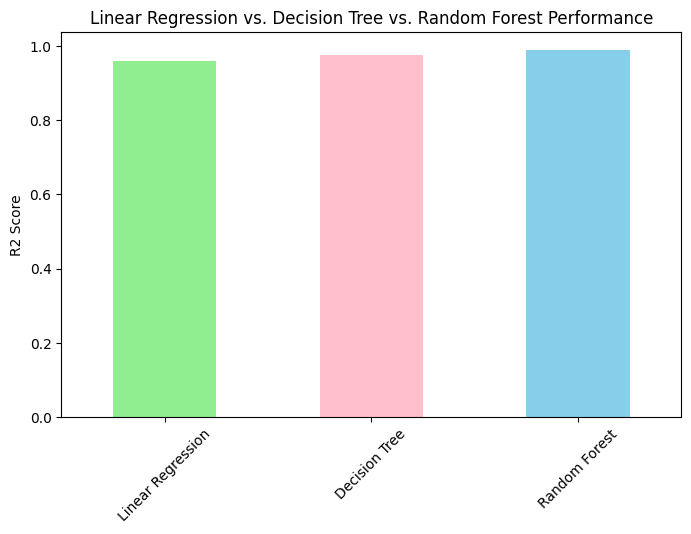

In [103]:
# Convert results to DataFrame
results_df = pd.DataFrame(results).T
print(results_df)

# Plot comparison of R2 scores
results_df["R2 Score"].plot(kind="bar", figsize=(8,5), color=["lightgreen", "pink", "skyblue"])
plt.title("Linear Regression vs. Decision Tree vs. Random Forest Performance")
plt.ylabel("R2 Score")
plt.xticks(rotation=45)
plt.show()

## Level 3 Task 2
###Task: Customer Preference Analysis


#Analyze the relationship between cuisine type and restaurant rating

In [77]:
# Splitting multiple cuisines and analyzing them separately
df['Cuisines'] = df['Cuisines'].str.split(', ')

# Exploding cuisines to have one cuisine per row
df_exploded = df.explode('Cuisines')

# Grouping by cuisine and calculating average rating
cuisine_rating = df_exploded.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)

# Display top cuisines by rating
print("Top cuisines by rating:")
print(cuisine_rating.head(10))

Top cuisines by rating:
Cuisines
Sunda         4.900000
B�_rek        4.700000
Taiwanese     4.650000
Ramen         4.500000
Dim Sum       4.466667
Hawaiian      4.412500
D�_ner        4.400000
Bubble Tea    4.400000
Curry         4.400000
Kebab         4.380000
Name: Aggregate rating, dtype: float64


<ipython-input-84-0908d7515c31>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_cuisines_rating, x="Aggregate rating", y="Cuisines", palette="coolwarm")


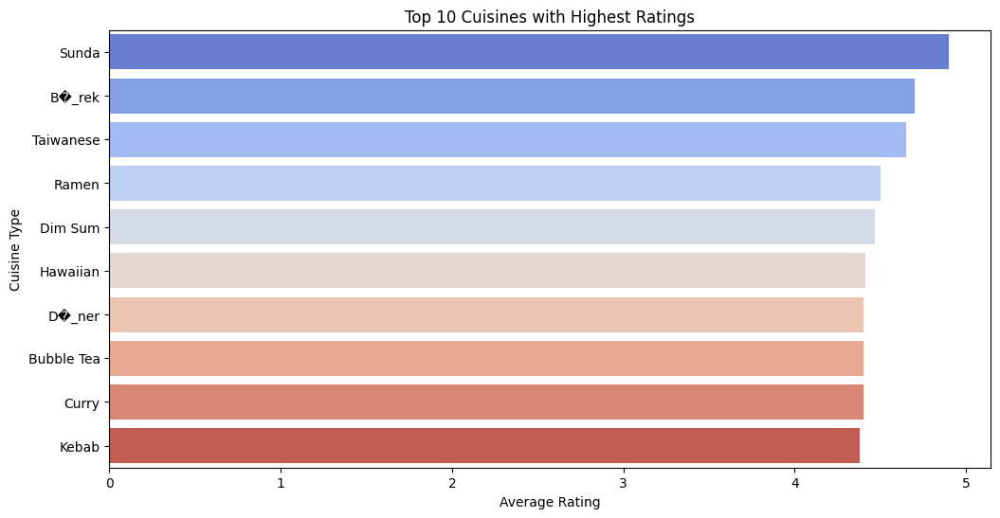

In [84]:
# Group by cuisine type and calculate the average rating
# Reset index to create a normal DataFrame
cuisine_rating = df_exploded.groupby("Cuisines")["Aggregate rating"].mean().reset_index()

# Sort cuisines by rating in descending order
cuisine_rating = cuisine_rating.sort_values(by="Aggregate rating", ascending=False)

# Select top 10 cuisines for better visualization
top_cuisines_rating = cuisine_rating.head(10)

# Plot the results
plt.figure(figsize=(12, 6))
sns.barplot(data=top_cuisines_rating, x="Aggregate rating", y="Cuisines", palette="coolwarm")
plt.xlabel("Average Rating")
plt.ylabel("Cuisine Type")
plt.title("Top 10 Cuisines with Highest Ratings")
plt.show()

#Identify the most popular cuisines based on the number of votes

In [81]:
# Identify most popular cuisines based on votes
cuisine_votes = df_exploded.groupby('Cuisines')['Votes'].sum().sort_values(ascending=False)

# Display top cuisines by popularity
print("\nTop cuisines by votes:")
print(cuisine_votes.head(10))


Top cuisines by votes:
Cuisines
North Indian    595981
Chinese         364351
Italian         329265
Continental     288255
Fast Food       184058
American        183117
Cafe            177568
Mughlai         151946
Desserts        105889
Asian           104303
Name: Votes, dtype: int64


<ipython-input-83-34025623028c>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=cuisine_popularity.head(10), x="Votes", y="Cuisines", palette="coolwarm")


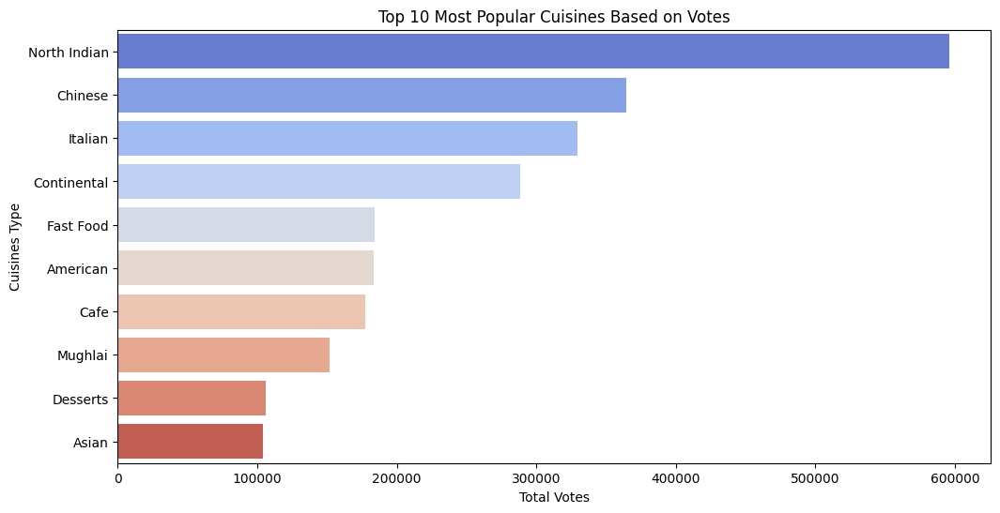

In [83]:
# Group by cuisine type and sum the votes
# Explode the Cuisines column before grouping
cuisine_popularity = df.explode("Cuisines").groupby("Cuisines")["Votes"].sum().reset_index()

# Sort cuisines by the number of votes in descending order
cuisine_popularity = cuisine_popularity.sort_values(by="Votes", ascending=False)

# Plot the results
plt.figure(figsize=(12, 6))
sns.barplot(data=cuisine_popularity.head(10), x="Votes", y="Cuisines", palette="coolwarm")
plt.xlabel("Total Votes")
plt.ylabel("Cuisines Type")
plt.title("Top 10 Most Popular Cuisines Based on Votes")
plt.show()

#Determine if specific cuisines tend to receive higher ratings

In [86]:
# Identify cuisines that tend to receive higher ratings

# Setting a threshold for high rating (e.g., 4.0 and above)
high_rating_cuisines = df_exploded[df_exploded['Aggregate rating'] >= 4.0]

# Counting occurrences of each cuisine in high-rated restaurants
popular_high_rating_cuisines = high_rating_cuisines['Cuisines'].value_counts().head(10)

# Display most frequent cuisines among high-rated restaurants
print("\nCuisines frequently receiving high ratings:")
print(popular_high_rating_cuisines)

# Determine if specific cuisines tend to receive higher ratings
threshold_count = popular_high_rating_cuisines.max() * 0.5
high_rated_cuisines_list = popular_high_rating_cuisines[popular_high_rating_cuisines >= threshold_count].index.tolist()
print("\nCuisines that consistently receive higher ratings:")
print(high_rated_cuisines_list)


Cuisines frequently receiving high ratings:
Cuisines
North Indian    323
Italian         264
Continental     223
Chinese         222
Cafe            201
American        158
Desserts        118
Asian           107
Fast Food        98
Seafood          89
Name: count, dtype: int64

Cuisines that consistently receive higher ratings:
['North Indian', 'Italian', 'Continental', 'Chinese', 'Cafe']


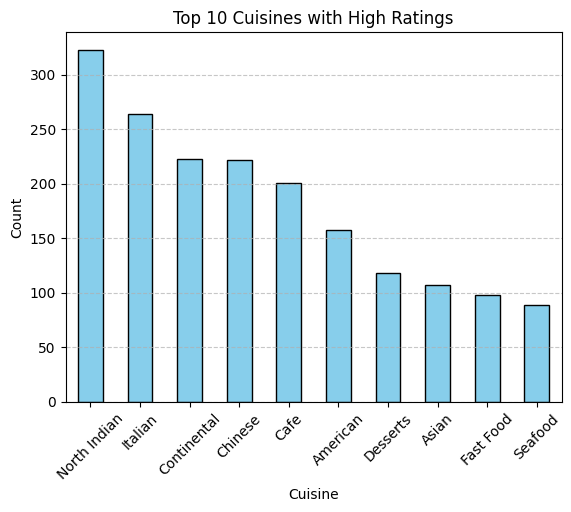

In [87]:
# Visualizing cuisines that frequently receive high ratings
popular_high_rating_cuisines.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Top 10 Cuisines with High Ratings')
plt.xlabel('Cuisine')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


##Level 3 Task 3
###Task: Data Visualization

#Visualize the distribution of ratings

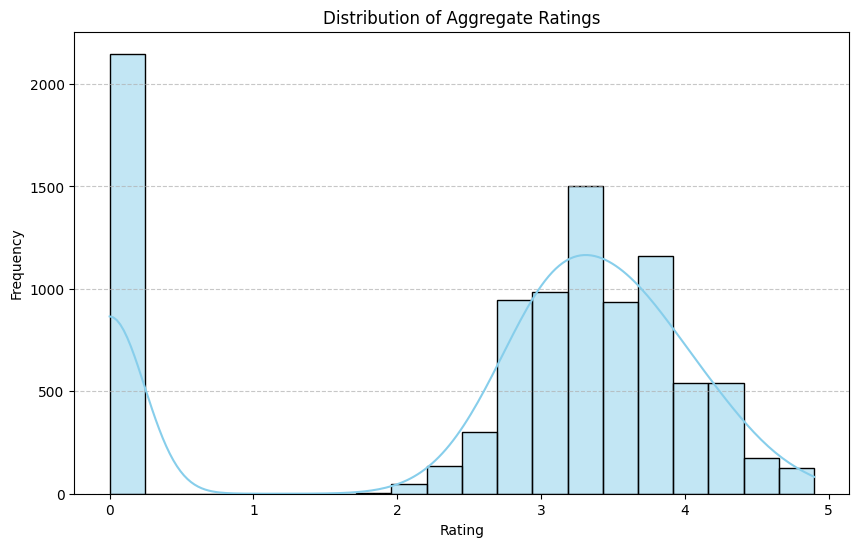

In [88]:
# Histogram of ratings
plt.figure(figsize=(10, 6))
sns.histplot(df['Aggregate rating'], bins=20, kde=True, color='skyblue', edgecolor='black')
plt.title('Distribution of Aggregate Ratings')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

<ipython-input-89-1d53e5acad38>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Aggregate rating', data=df, palette='coolwarm', order=sorted(df['Aggregate rating'].unique()))


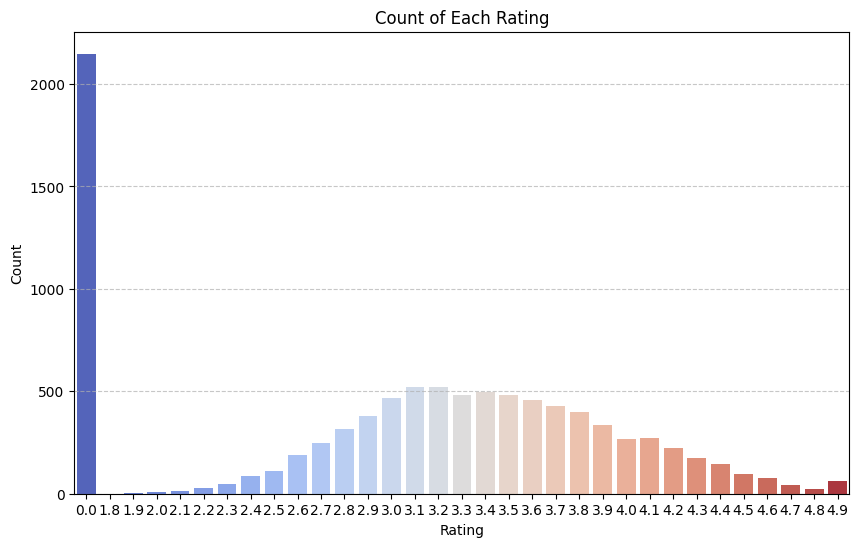

In [89]:
# Bar plot of ratings count
plt.figure(figsize=(10, 6))
sns.countplot(x='Aggregate rating', data=df, palette='coolwarm', order=sorted(df['Aggregate rating'].unique()))
plt.title('Count of Each Rating')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Compare average ratings of different features

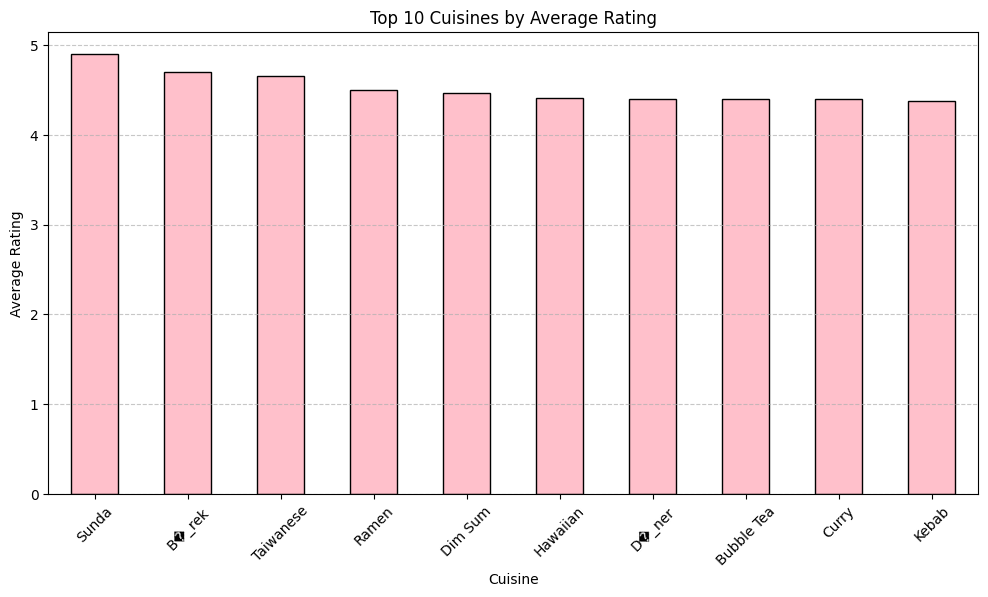

In [91]:
# Average rating by cuisine
df_exploded = df.explode('Cuisines')
cuisine_avg_rating = df_exploded.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)
plt.figure(figsize=(12, 6))
cuisine_avg_rating.head(10).plot(kind='bar', color='pink', edgecolor='black')
plt.title('Top 10 Cuisines by Average Rating')
plt.xlabel('Cuisine')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

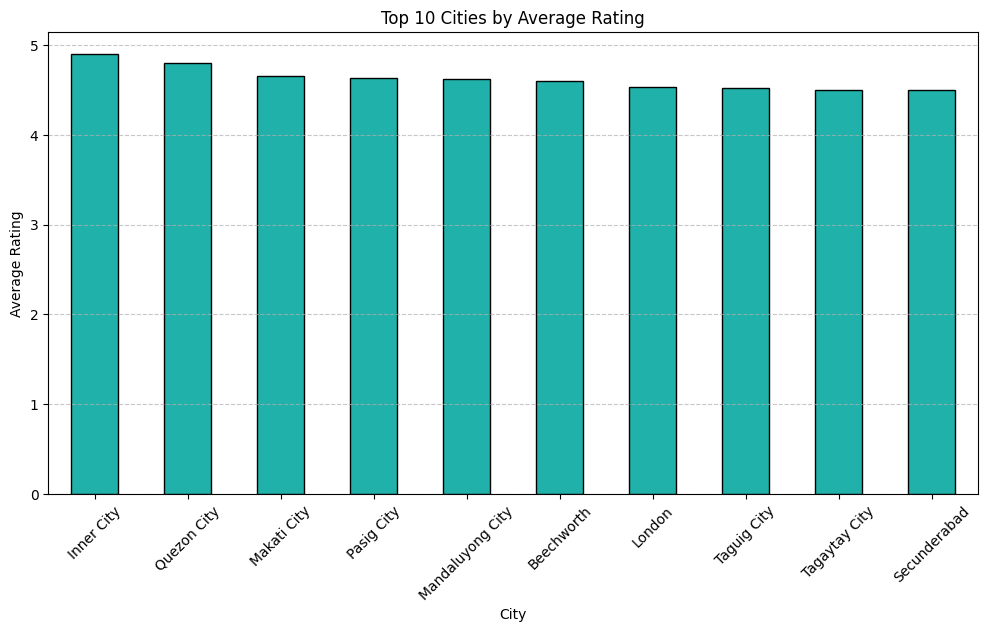

In [92]:
# Average rating by city
city_avg_rating = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
plt.figure(figsize=(12, 6))
city_avg_rating.head(10).plot(kind='bar', color='lightseagreen', edgecolor='black')
plt.title('Top 10 Cities by Average Rating')
plt.xlabel('City')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

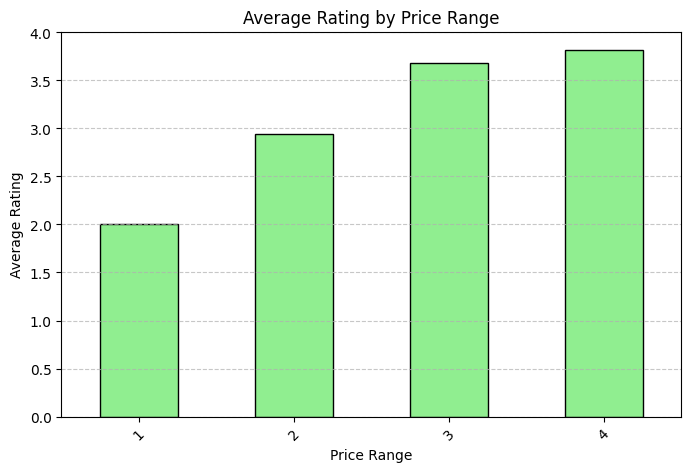

In [104]:
# Average rating by price range
price_avg_rating = df.groupby('Price range')['Aggregate rating'].mean()
plt.figure(figsize=(8, 5))
price_avg_rating.plot(kind='bar', color='lightgreen', edgecolor='black')
plt.title('Average Rating by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Visualize relationship between various features and target variable


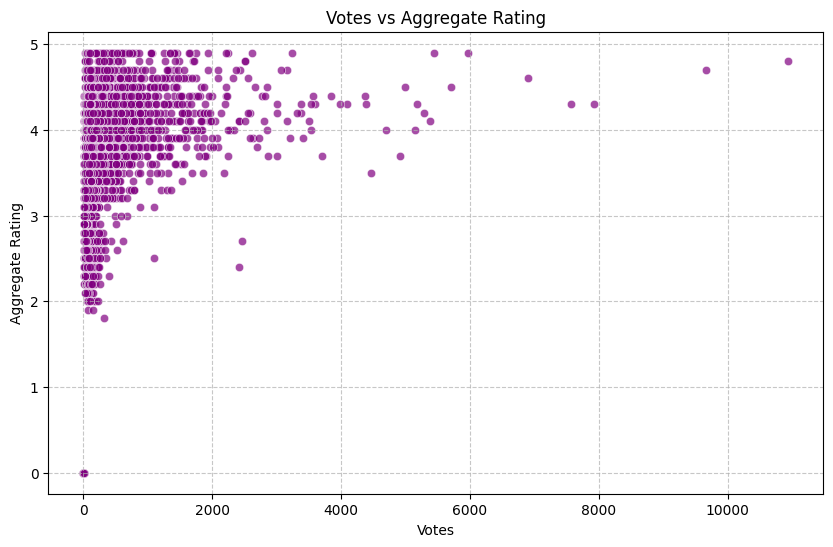

In [96]:
# Relationship between Votes and Aggregate Rating
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Votes', y='Aggregate rating', data=df, alpha=0.7, color='purple')
plt.title('Votes vs Aggregate Rating')
plt.xlabel('Votes')
plt.ylabel('Aggregate Rating')
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.show()

<ipython-input-97-7521b7f06859>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Price range', y='Aggregate rating', data=df, palette='muted')


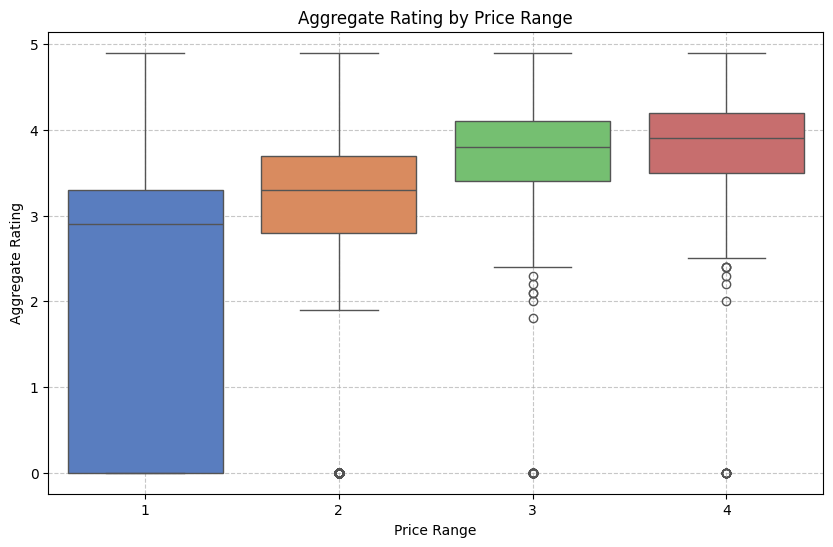

In [97]:
# Boxplot of ratings by price range
plt.figure(figsize=(10, 6))
sns.boxplot(x='Price range', y='Aggregate rating', data=df, palette='muted')
plt.title('Aggregate Rating by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Aggregate Rating')
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.show()

<ipython-input-98-479073726b3e>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Has Online delivery', y='Aggregate rating', data=df, palette='cool')


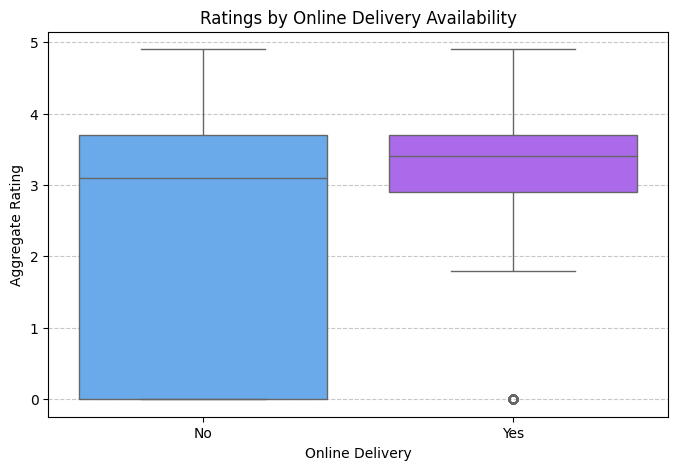

In [98]:
# Distribution of ratings by online order availability
plt.figure(figsize=(8, 5))
sns.boxplot(x='Has Online delivery', y='Aggregate rating', data=df, palette='cool')
plt.title('Ratings by Online Delivery Availability')
plt.xlabel('Online Delivery')
plt.ylabel('Aggregate Rating')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

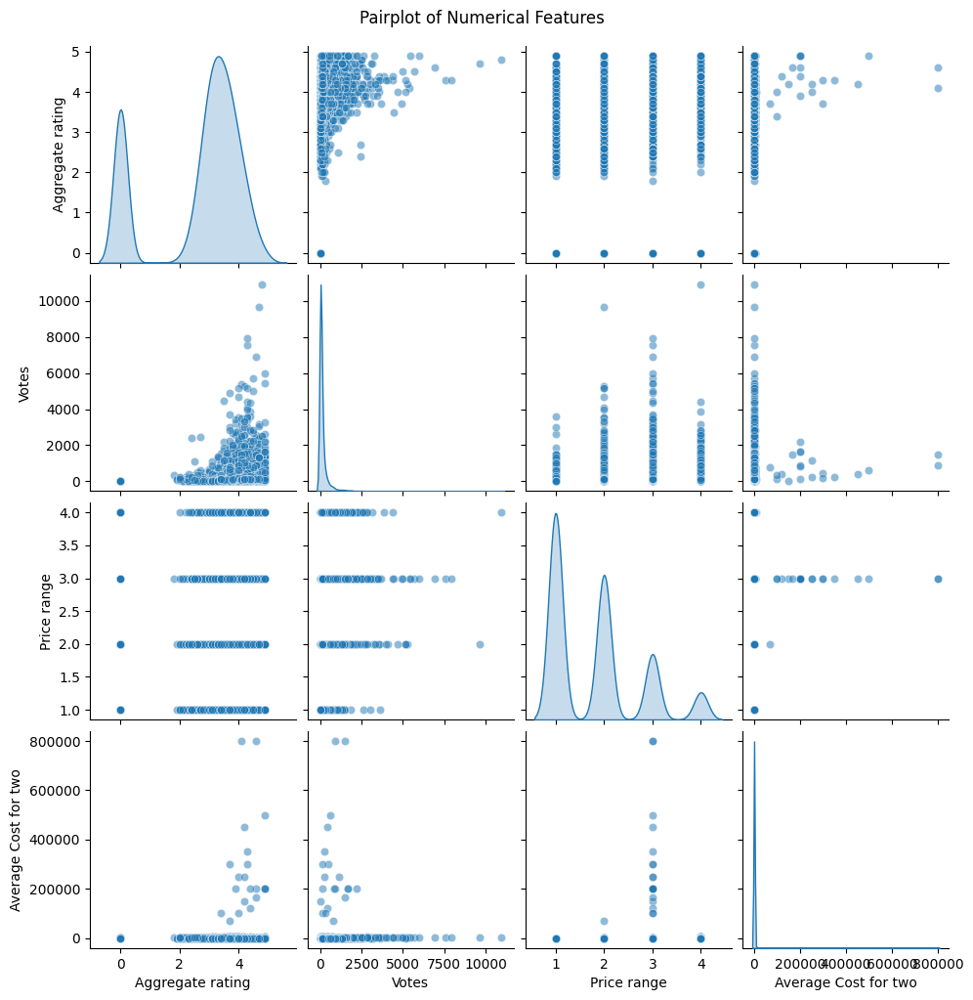

In [102]:
# Pairplot for exploring relationships between numerical variables
sns.pairplot(df[['Aggregate rating', 'Votes', 'Price range', 'Average Cost for two']], diag_kind='kde', plot_kws={'alpha':0.5})
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()